## Tourism and Gentrification: The Case of San Juan, Puerto Rico (Part 2)

### Tourism: Hotels and Tourist Inns

This notebook is a continuation of my first final notebook. Here, I explore my hotel and tourist inns data, as well as create some multi-layered maps.

In [86]:
#uploading my data
myshpfile = gpd.read_file('g07_turismo_paradores_hoteles.shp')
myshpfile.to_file('myJson.geojson', driver='GeoJSON')

In [87]:
#to be able to map
tourism=gpd.GeoDataFrame(myshpfile, geometry=gpd.points_from_xy(myshpfile.easting, myshpfile.northing))

In [88]:
# subset the zero coordinate records
tourism[tourism.easting==0]

,height,id,northing,easting,nombre_,z_de_habit,direccion,pueblo,zip_code,telefono,telefono_1,fax,e_mail,endosado,zip_code_1,globalid,shape_leng,shape_area,geometry
165,0.0,0,0.0,0.0,Acacia Seaside Inn,None,"8 Taft Street, Ocean park",San Juan,911.0,0.0,787-725-0668,787-728-0671,reservations@acaciaseasideinn.com,Si,None,{4E108A7A-58D0-4779-A3FB-2AA440CE0B40},77.574326,322.788820,POINT (0.00000 0.00000)
167,0.0,0,0.0,0.0,ESJ Towers,None,None,Carolina,0.0,0.0,787-791-5151,787-641-3836,reservations@esjtowers.com,Si,00979,{C04F897B-6B4D-41C9-AC8C-8CA7DEAAF5C1},298.993814,2362.960658,POINT (0.00000 0.00000)
168,0.0,0,0.0,0.0,Embassy Suites Hotel & Casino,None,"8000 Tartak Street, Isla Verde",Carolina,0.0,0.0,787-791-0505,787-791-7776,max_rosado@hilton.com,Si,None,{83FFE20E-1012-4796-90E9-760E50AFC3B3},614.391991,12480.229048,POINT (0.00000 0.00000)
169,0.0,0,0.0,0.0,Borinquen Beach Inn,None,"5451 Isla Verde Avenue, Isla Verde",Carolina,0.0,0.0,787-728-8400,787-268-2411,Borinquenbeachinn@yahoo.com,Si,00979,{DA8033AF-CBEF-4640-B60C-AFD60230A26E},103.132416,499.997856,POINT (0.00000 0.00000)
170,0.0,0,0.0,0.0,Casa De Amistad,None,Calle Benite Castaño #27,Vieques,0.0,0.0,787-741-3758,N/A,viequesamistad@aol.com,Si,00765,{32A7C9CB-583F-438D-8274-29199780BF1B},64.243316,197.565217,POINT (0.00000 0.00000)
173,0.0,0,0.0,0.0,Las Casitas Village and Golden Door Spa,None,1000 El Conquistador,Fajardo,0.0,0.0,787-863-1000,787-863-6758,http://www.lascasitasvillage.com,Si,00738,{9B5835E1-9E3A-449E-BEAD-7AD306556D9F},156.163671,1151.065334,POINT (0.00000 0.00000)
174,0.0,0,0.0,0.0,Club Cala,None,"270 Harbour Drive suite No. 1, Palmas del Mar",Humacao,791.0,0.0,787-852-6000,787-852 6370,gmpr@villasatpalmas.com,Si,00791,{8CB3BF8E-C8A6-491E-B1F7-572E0B606DE8},388.413628,2204.778619,POINT (0.00000 0.00000)
175,0.0,0,0.0,0.0,Las Villas de Palma,None,"275 Palmas Inn Way, Suite 6",Humacao,0.0,0.0,939-645-0916,787-852-0927,jpico@villasatpalmas.com,Si,00791,{68646809-4094-4AB1-9084-0F056221956F},177.917015,1281.253270,POINT (0.00000 0.00000)
176,0.0,0,0.0,0.0,Club Seabourne,None,State Road 252 Sardinas 11 Beach,Culebra,0.0,0.0,787-742-3169,787-742-0210,mjose227@aol.com,Si,00775,{AA546375-0F05-49A7-8E0C-E2BF7263FEC2},104.296072,551.483322,POINT (0.00000 0.00000)
177,0.0,0,0.0,0.0,Parador JB Hidden Village,None,"Road 2, Int. 4416, km 1.3",Aguada,0.0,0.0,787-868-8686,787-868-8701,N/A,Si,None,{40D84971-CAD0-4D93-89F4-3EF6D5E194E7},114.049362,571.763614,POINT (0.00000 0.00000)


In [89]:
# drop the unmapped rows
tourism = tourism[tourism.easting!=0]

<AxesSubplot:>

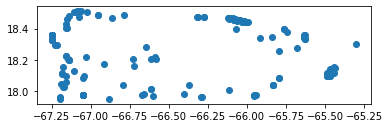

In [90]:
tourism.plot()

In [91]:
#let me create the web_mercator before forgetting

tourism.crs = "EPSG:4326"
tourism_web_mercator= tourism.to_crs(epsg=3857)

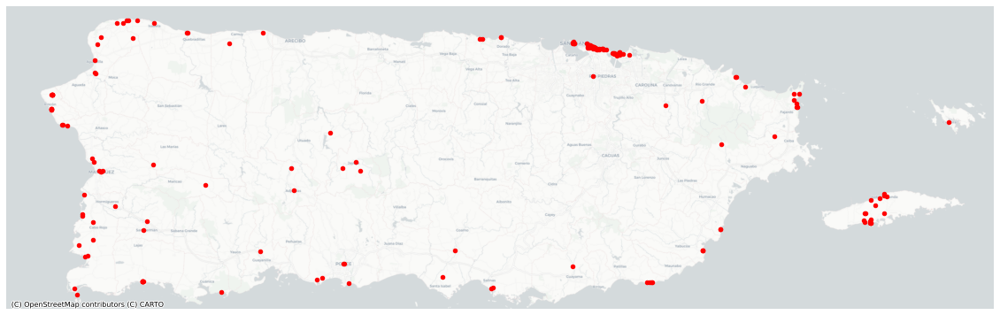

In [92]:
# map it!
fig,ax = plt.subplots(figsize=(20,20))

tourism_web_mercator.plot(ax=ax,
             color='red',
             markersize=20)

# no axis
ax.axis('off')
ax2.set_title("Hotels and Tourist Inns in Puerto Rico")
# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)


In [93]:
#okay, let's get rid of the rest of the hotels now. Data clean up
#trim the data to the bare minimum columns
tourism = tourism[['id','nombre_','pueblo','geometry']]

# rename the columns
tourism.columns = ['id','hotel','town', 'geometry']

In [94]:
tourism.head()

,id,hotel,town,geometry
0,218,Bravo Beach Hotel/Ocean Side Boutique Hotel,Vieques,POINT (-65.44160 18.15550)
1,227,Ocean View Hotel,Vieques,POINT (-65.44300 18.15080)
2,212,Wyndham Martineau Bay Resort & Spa,Vieques,POINT (-65.47130 18.14170)
3,213,Crow's Nest Inn,Vieques,POINT (-65.46210 18.13100)
4,228,Casa del Francés,Vieques,POINT (-65.47070 18.10210)


In [95]:
tourism['town'].value_counts()

San Juan        44
Carolina        17
Vieques         16
Rincon          13
Cabo Rojo       11
Isabela          6
Lajas            6
Mayaguez         6
Fajardo          6
Aguadilla        5
Ponce            5
Patillas         4
Dorado           4
Yabucoa          3
Jayuya           3
Rio Grande       3
San German       2
Quebradillas     2
Adjuntas         2
Humacao          2
Salinas          2
Las Marias       1
Santa Isabel     1
Anasco           1
Hormigueros      1
Ceiba            1
Camuy            1
Luquillo         1
Culebra          1
Guayanilla       1
Utuado           1
Cayey            1
Canovanas        1
Naguabo          1
Guanica          1
Coamo            1
Hatilllo         1
Maricao          1
Name: town, dtype: int64

There are 44 hotels in San Juan. Let's only have them.

In [96]:
tourism_sorted = tourism.sort_values(by='town')
# I want to see all the data
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [97]:
tourism_sorted

,id,hotel,town,geometry
91,1,Monte Río Hotel,Adjuntas,POINT (-66.72290 18.16170)
126,2,Parador Villas Sotomayor,Adjuntas,POINT (-66.72750 18.20740)
116,9,Hacienda El Pedregal,Aguadilla,POINT (-67.15430 18.40490)
115,10,Cielo Mar Hotel,Aguadilla,POINT (-67.15240 18.40250)
110,7,La Cima Hotel,Aguadilla,POINT (-67.10520 18.50590)
112,5,Parador El Faro,Aguadilla,POINT (-67.14850 18.46280)
111,4,Punta Borinquen Resort & Casino,Aguadilla,POINT (-67.14060 18.47760)
184,12,Rincón Beach Resort,Anasco,POINT (-67.21380 18.29610)
123,17,Joyuda Beach Hotel,Cabo Rojo,POINT (-67.17670 18.15250)
122,14,Lighthouse Inn,Cabo Rojo,POINT (-67.15820 18.09690)


In [98]:
#Okay, now I just remove the ones I am not going to need.
tourism = tourism.drop([91,126,116,115,110,112,111,184,123,122,121,120,
                        119,152,98,101,99,100,179,153,77,21,14,81,130,129,9,13,145,135,128,95,85,93,178,18,17,109,108,
                       107,106,105,190,197,146,90,147,113,138,96,97,114,118,148,198,125,124,117,94,161,185,79,16,15,84,134,127,
                       89,87,86,88,103,102,143,142,141,140,160,104,139,59,166,183,83,144,151,74,76,78,137,80,156,159,
                       189,92,6,3,4,2,1,5,7,154,171,8,157,150,149,131,172,0,19,20,136,57,67,68,58,56,65,61,69,70,66,
                       71,63,132,72,10,158,62,75,82,192,193])

In [99]:
tourism

,id,hotel,town,geometry
11,178,Gallery Inn,San Juan,POINT (-66.11650 18.46810)
12,199,Holiday Inn Express,San Juan,POINT (-66.07570 18.45710)
22,164,Alelí by the Sea Guest House,San Juan,POINT (-66.07290 18.45720)
23,158,El Convento Hotel,San Juan,POINT (-66.11850 18.46600)
24,194,Park Plaza Normandie,San Juan,POINT (-66.08730 18.46430)
25,173,Hotel Casa San Jose,San Juan,POINT (-66.11690 18.46430)
26,195,Caribe Hilton,San Juan,POINT (-66.08540 18.46340)
27,193,Wyndham Condado Plaza Hotel & Casino,San Juan,POINT (-66.08100 18.46090)
28,159,Hotel,San Juan,POINT (-66.08000 18.46050)
29,161,San Juan Beach Hotel,San Juan,POINT (-66.07810 18.45960)


In [100]:
tourism.shape

(44, 4)

In [101]:
#Good! Let's map it now.

In [102]:
#let me create the web_mercator before forgetting

tourism.crs = "EPSG:4326"
tourism_web_mercator= tourism.to_crs(epsg=3857)

In [103]:
tourism_web_mercator.shape

(44, 4)

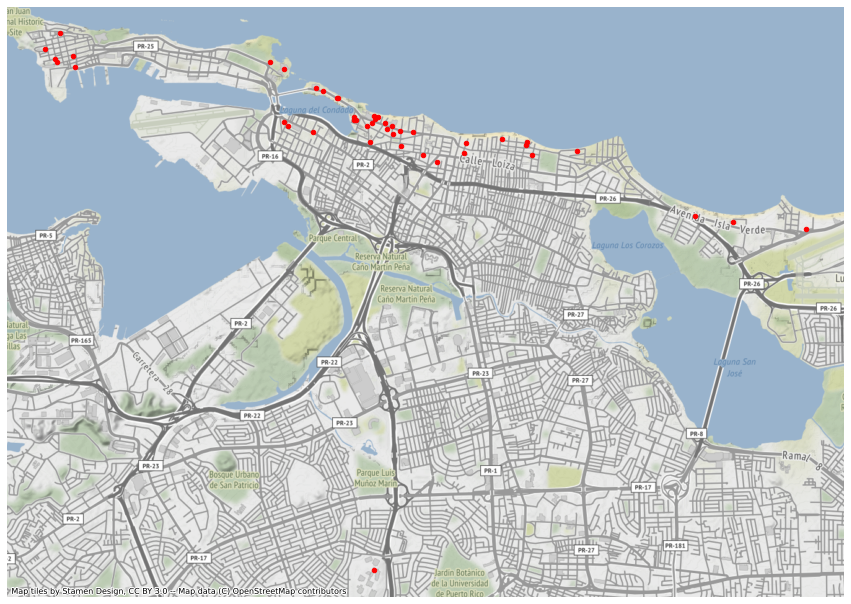

In [104]:
# map it!
fig,ax = plt.subplots(figsize=(15,15))

tourism_web_mercator.plot(ax=ax,
             color='red',
             markersize=20)

# no axis
ax.axis('off')
ax2.set_title("Hotels and Tourist Inns in Puerto Rico")
# add a basemap
ctx.add_basemap(ax)


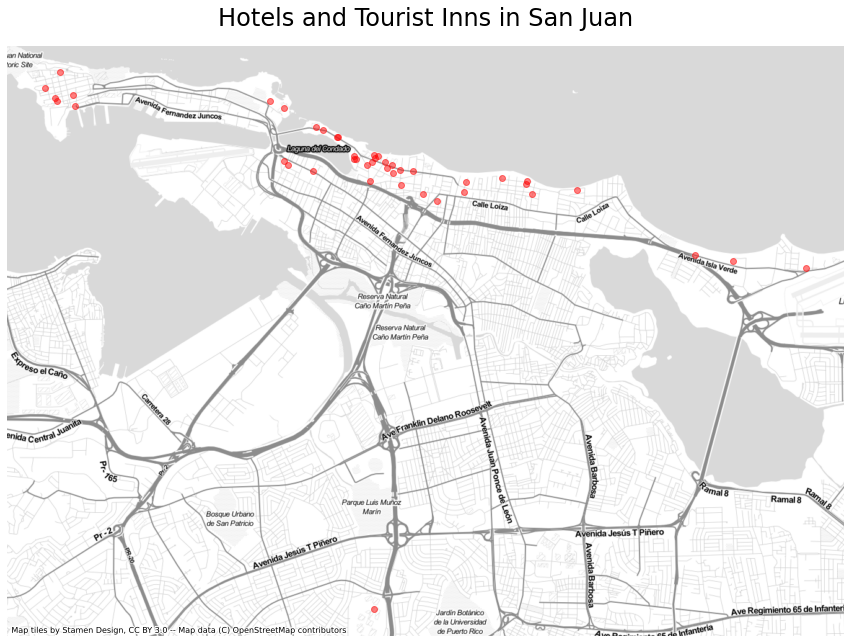

In [107]:
fig, ax = plt.subplots(figsize=(15, 15))

# add the layer with ax=ax in the argument 
tourism_web_mercator.plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Hotels and Tourist Inns in San Juan',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.Stamen.TonerLite)

#### Creating multi-layered maps

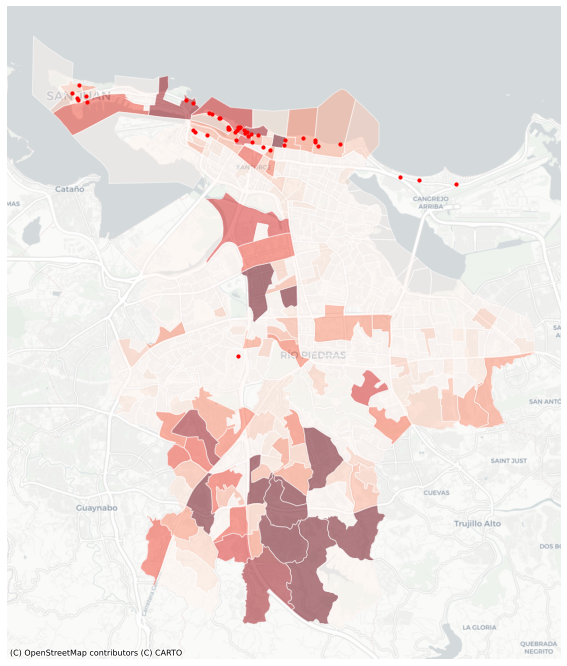

In [108]:
# set up the plot canvas with plt.subplots
fig, ax = plt.subplots(figsize=(12, 12))

# blockgroups (income)
income_web_mercator.plot(ax=ax, # this puts it in the ax plot
        cmap='Reds',
            scheme='user_defined',
            classification_kwds={'bins':[10,20,30,40,50,60,70,80,90,100]},
        edgecolor='white',
        alpha=0.5, 
        column='Percent Households with More than $125,000')

# hotels
tourism_web_mercator.plot(ax=ax, # this also puts it in the same ax plot
            color='red',
            markersize=10
            )

# use the bounding box coordinates to set the x and y limits
#
#ax.set_xlim(minx - 100, maxx + 1000) # added/substracted value is to give some margin around total bounds
#ax.set_ylim(miny - 100, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

The map above shows where the hotels in San Juan are, and the percent of households that earn a high income (above 125,000). 

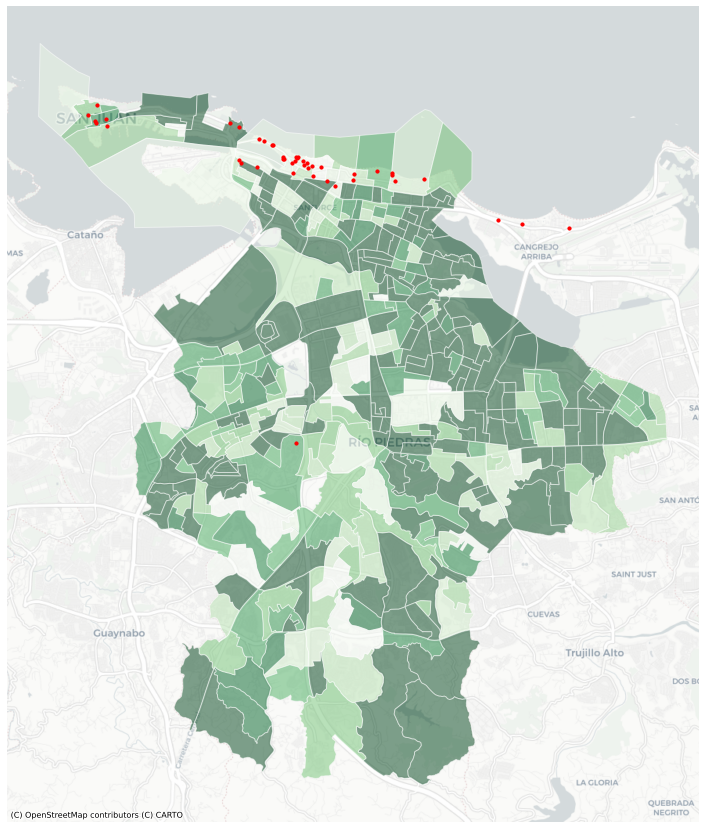

In [109]:
# set up the plot canvas with plt.subplots
fig, ax = plt.subplots(figsize=(15, 15))

# blockgroups (income)
income_web_mercator.plot(ax=ax, # this puts it in the ax plot
        cmap='Greens',
        scheme='user_defined',
                         classification_kwds={'bins':[10,20,30,40,50,60,70,80,90,100]},
        edgecolor='white',
        alpha=0.5, 
        column='Percent Households with Less than $19,999')

# hotels
tourism_web_mercator.plot(ax=ax, # this also puts it in the same ax plot
            color='red',
            markersize=10
            )

# use the bounding box coordinates to set the x and y limits
#
#ax.set_xlim(minx - 100, maxx + 1000) # added/substracted value is to give some margin around total bounds
#ax.set_ylim(miny - 100, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

The map above shows the hotels in San Juan, as well as the population that leaves under the poverty threshold.

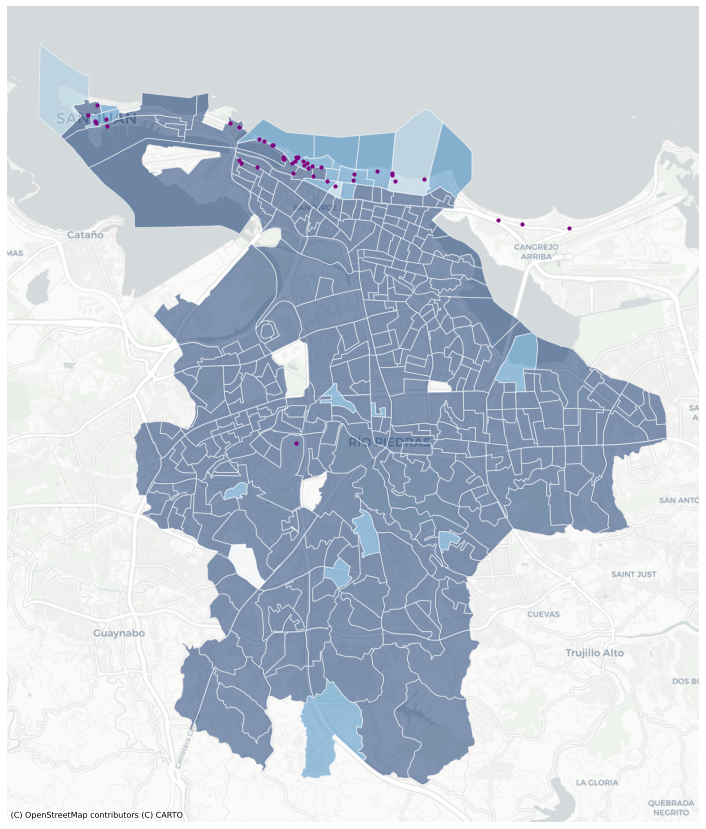

In [110]:
# set up the plot canvas with plt.subplots
fig, ax = plt.subplots(figsize=(15, 15))

# blockgroups (income)
race_web_mercator.plot(ax=ax, # this puts it in the ax plot
        cmap='Blues',
        edgecolor='white',
                       scheme='user_defined',
            classification_kwds={'bins':[10,20,30,40,50,60,70,80,90,100]},
        alpha=0.5, 
        column='Percent Hispanic')

# hotels
tourism_web_mercator.plot(ax=ax, # this also puts it in the same ax plot
            color='purple',
            markersize=10
            )

# use the bounding box coordinates to set the x and y limits
#
#ax.set_xlim(minx - 100, maxx + 1000) # added/substracted value is to give some margin around total bounds
#ax.set_ylim(miny - 100, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

This map above shows the Hispanic population with hotels. It clearly gets lighther in Santurce...

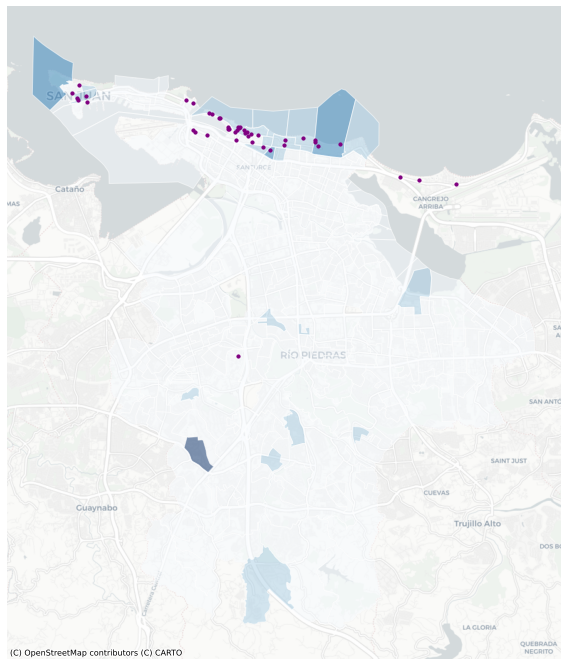

In [111]:
# set up the plot canvas with plt.subplots
fig, ax = plt.subplots(figsize=(12, 12))

# blockgroups (income)
race_web_mercator.plot(ax=ax, # this puts it in the ax plot
        cmap='Blues',
        edgecolor='white',
                       scheme='user_defined',
            classification_kwds={'bins':[10,20,30,40,50,60,70,80,90,100]},
        alpha=0.5, 
        column='Percent Not Hispanic')

# hotels
tourism_web_mercator.plot(ax=ax, # this also puts it in the same ax plot
            color='purple',
            markersize=10
            )

# use the bounding box coordinates to set the x and y limits
#
#ax.set_xlim(minx - 100, maxx + 1000) # added/substracted value is to give some margin around total bounds
#ax.set_ylim(miny - 100, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Finally, the map above shows the hotels with the percentage of Non-Hispanic population.

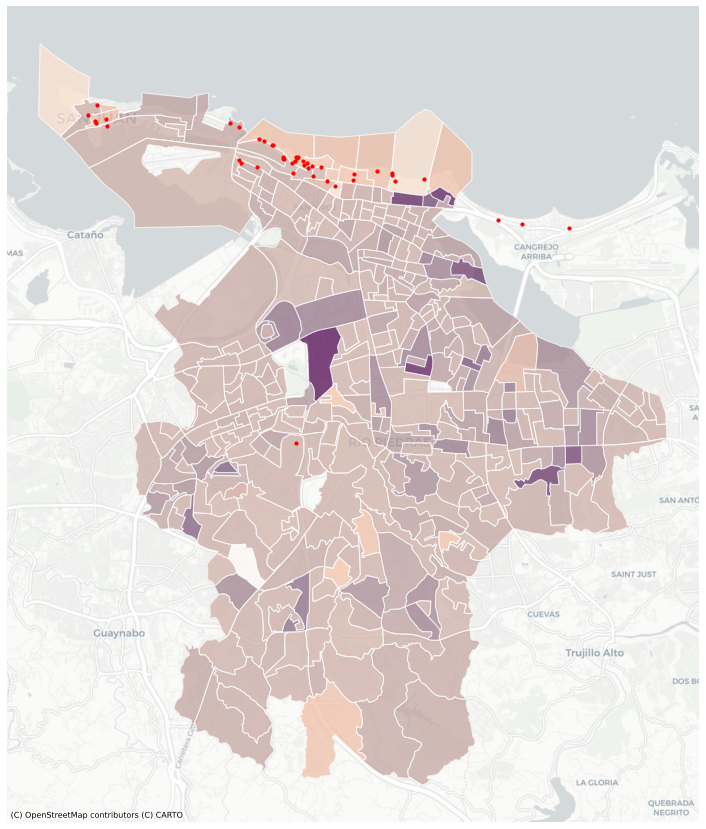

In [113]:
# set up the plot canvas with plt.subplots
fig, ax = plt.subplots(figsize=(15, 15))

# blockgroups (income)
race_web_mercator.plot(ax=ax, # this puts it in the ax plot
        cmap='Oranges',
        edgecolor='white',
        alpha=0.5,
                       scheme='user_defined',
            classification_kwds={'bins':[10,20,30,40,50,60,70,80,90,100]},
        column='Percent Hispanic')

# income
income_web_mercator.plot(ax=ax, # this also puts it in the same ax plot
             cmap='Purples',
        edgecolor='white',
        alpha=0.5, 
        column='Percent Households with Less than $19,999')

#hotels
tourism_web_mercator.plot(ax=ax, # this also puts it in the same ax plot
            color='red',
            markersize=10
            )

# use the bounding box coordinates to set the x and y limits
#
#ax.set_xlim(minx - 100, maxx + 1000) # added/substracted value is to give some margin around total bounds
#ax.set_ylim(miny - 100, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

The two maps above I am not sure if they're the best... one shows the percent of Not Hispanic and population that lives with high income (and the hotels are mapped there as well). The second one shows the percent of Hispanics and people living under poverty (with hotels). I don't think this is too illuminating (rather, it's quite confusing).

#### Extras

Below, I will do some things that will produce errors. I am just leaving this as part of my draft (not the final version). Just putting this here so I can ask Yoh, or Ryan, or Chris.

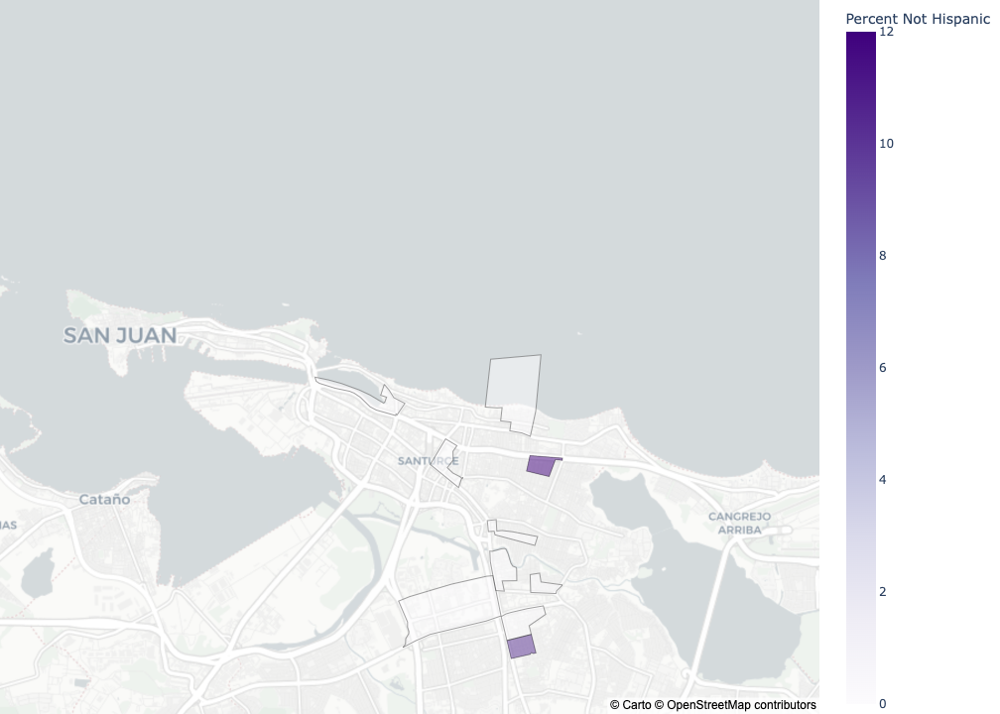

In [118]:
import plotly.express as px

fig = px.choropleth_mapbox(race, geojson=race, locations='Total', color='Percent Not Hispanic',
                           color_continuous_scale="Purples",
                           range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=12, center = {"lat": 18.465, "lon": -66.1057},
                           opacity=0.5,
                           labels={''}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Okay that worked better than I had thought... I think I could improve it. I also wonder if I can add the hotels here...

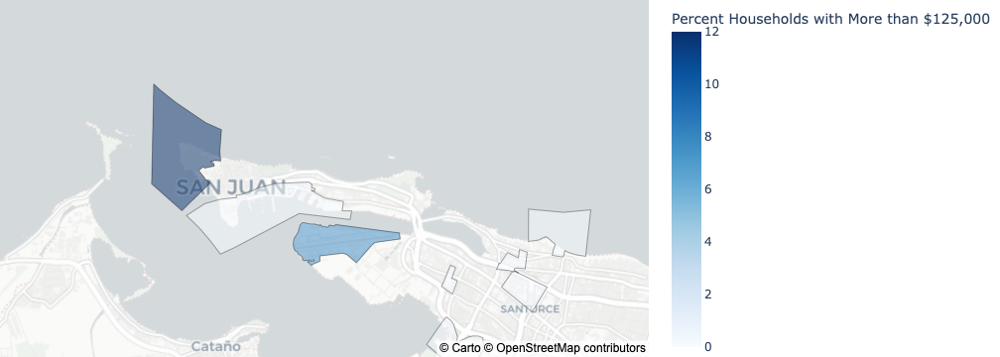

In [123]:
fig = px.choropleth_mapbox(income, geojson=income, locations='Total', color='Percent Households with More than $125,000',
                           color_continuous_scale="Blues",
                           range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=12, center = {"lat": 18.465, "lon": -66.1057},
                           opacity=0.5,
                           labels={''}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

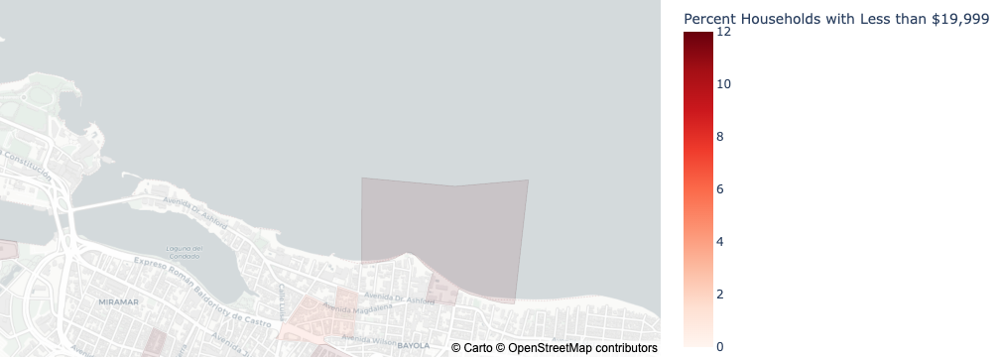

In [122]:
fig = px.choropleth_mapbox(income, geojson=income, locations='Total', color='Percent Households with Less than $19,999',
                           color_continuous_scale="Reds",
                           range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=12, center = {"lat": 18.4481, "lon": -66.0642},
                           opacity=0.5,
                           labels={''}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()